# Data Understanding

- https://mediahub.seoul.go.kr/archives/2004079
- http://www.newskr.kr/news/articleView.html?idxno=75768
- https://www.segye.com/newsView/20220923509500

- 위의 뉴스 기사들을 읽어보면 서울시가 전동 킥보드를 이용하여 시민들이 이용할 수 있는 제도를 활성화 한 상태이다. 하지만 수거 비용 및 불법 주정차한 킥보드들이 사회 문제로 대두되고 있어서 데이터를 활용하여 이러한 문제를 해결해 보고자 한다.

- 활용데이터
    1. 자치구단위 서울 생활인구 데이터 : https://data.seoul.go.kr/dataList/OA-15379/S/1/datasetView.do
        - 서울시 구별로 인구수를 확인할 수 있다. (일별로 집계되어있음)
        - 분석에는 주,야간 인구수와 최대 및 최소 인구수만 사용하였음
        
    2. 서울시 전동킥보드 견인 현황 :https://data.seoul.go.kr/dataList/OA-15379/S/1/datasetView.do 
        - 서울시 자치구 별로 어떠한 유형대로 전동 킥보드를 수거하였는지 집계
        - 전동 킥보드를 수거한 날짜 데이터

# Library import

In [1]:
import pandas as pd # 데이터 프레임을 다루기 위한 라이브러리 사용
import matplotlib.pyplot as plt # 시각화를 위한 라이브러리
import seaborn as sns # 시각화를 위한 라이브러리
import warnings  # warning 메시지 무시
import numpy as np # 수학적 용도를 위한 라이브러리
import requests
import json
from sklearn.model_selection import train_test_split, RandomizedSearchCV # 머신러닝을 위한 데이터 분리 #최적파라미터를 위한 랜덤서치
from sklearn.tree import plot_tree # tree 시각화를 위한 라이브러리
from sklearn.linear_model import LinearRegression # 선형회귀를 위한 LinearRegreesion 라이브러리
from sklearn.tree import DecisionTreeRegressor # 의사결정나무 사용
from sklearn.ensemble import RandomForestRegressor # 정확도를 위한 랜덤 포레스트
from sklearn.preprocessing import StandardScaler, PolynomialFeatures # 스케일링을 위한 정규화, # 피처엔지니어링을 위한 라이브러리
from sklearn.pipeline import Pipeline # 파이프라인활용
from scipy.stats import uniform, randint # 랜덤숫자 배열을 위해 사용
from sklearn.metrics import mean_squared_error # 정확도 판별을 위한 라이브러리
from sklearn.decomposition import PCA
import folium # 지도에 표시하기 위한 folium라이브러리

warnings.filterwarnings("ignore")  # warning메시지 무시
pd.options.display.float_format = "{:.5f}".format # 지수표현식말고 소수점 5자리까지 표현

In [2]:
# 시각화시 한글 깨짐 오류 방지
from matplotlib import rc
import seaborn as sns
%matplotlib inline
rc('font', family='AppleGothic')

plt.rcParams['axes.unicode_minus'] = False

# Data Scraping

- 수집한 데이터에 주소만 있고 위, 경도등 지리적 데이터가 존재하지 않아서, 위 경도 데이터를 수집하기 위해 데이터 스크레이핑을 사용하였다.
- https://address.dawul.co.kr/
- 위의 링크를 통하여 셀레니움을 활용하여 동적크롤링하여 데이터를 입력하고 위,경도 지리데이터를 받아왔다.

In [ ]:
from selenium import webdriver

In [ ]:
# 크롬드라이버 실행  (경로 예: '/Users/Roy/Downloads/chromedriver')
driver = webdriver.Safari()

#크롬 드라이버에 url 주소 넣고 실행
driver.get('https://address.dawul.co.kr/')

# 페이지가 완전히 로딩되도록 3초동안 기다림
time.sleep(2)
 
driver.switch_to.window(driver.window_handles[0])  # 메인 창으로 가기 

In [ ]:
from tqdm import trange, tqdm

lat = [] # 위도
log = [] # 경도

for num in trange(len(songpa_1)):
    search_box = driver.find_element(By.XPATH, r'//*[@id="input_juso"]')
    search_box.send_keys(songpa_1["주소"][num])
    search_box.send_keys(Keys.RETURN)
    for j in range(len(songpa_1["주소"][num])):
        search_box.send_keys(Keys.BACK_SPACE)
    time.sleep(1)
    result = driver.find_elements(By.XPATH, r'//*[@id="insert_data_5"]')
    
    for i in result:
        title = i.text
        res = re.split('[:|,]', title)
        lat.append(res[1])
        log.append(res[3])

# Data Load

- 서울시 킥보드 수거 데이터에서의 수거 구와 유형 그리고 날짜, 서울시 유동인구 데이터에서 날짜, 유동 인구수 등 분석에 필요한 컬럼만 추출했다.

In [3]:
board = pd.read_csv("./data/seouldata.csv", index_col="index", encoding = "cp949")

In [4]:
board.head()

,신고일,구정보,주소,유형,조치일,위도,경도
index,,,,,,,
0,2021-07-19,중구,서울특별시 중구 서소문동 37,보도와 차도가 구분된 도로의 차도,2021-07-19,37.56454,126.97559
1,2021-08-02,중구,서울특별시 중구 서소문동 37,"버스정류장, 택시 승강장",2021-08-02,37.56454,126.97559
2,2021-08-06,중구,서울특별시 중구 서소문동 37,"횡단보도, 산책로 등",2021-08-06,37.56454,126.97559
3,2021-09-10,중구,서울특별시 중구 서소문동 37,오신고,2021-09-10,37.56454,126.97559
4,2021-09-23,중구,서울특별시 중구 서소문동 37,기타,2021-09-23,37.56454,126.97559


In [5]:
human = pd.read_csv("./data/human.csv", encoding = "cp949")

In [6]:
human.columns

Index(['기준일ID', '시군구코드', '시군구명', '총생활인구수', '내국인생활인구수', '장기체류외국인인구수',
       '단기체류외국인인구수', '일최대인구수', '일최소인구수', '주간인구수(09~18)', '야간인구수(19~08)',
       '일최대이동인구수', '서울외유입인구수', '동일자치구행정동간이동인구수', '자치구간이동인구수'],
      dtype='object')

In [7]:
human_df = human[["기준일ID", "시군구명","주간인구수(09~18)", "야간인구수(19~08)","일최소인구수",
                  "일최대이동인구수", "자치구간이동인구수"]]

In [8]:
human_df = human.drop("시군구코드", axis = 1)

In [9]:
human_df.head()

,기준일ID,시군구명,총생활인구수,내국인생활인구수,장기체류외국인인구수,단기체류외국인인구수,일최대인구수,일최소인구수,주간인구수(09~18),야간인구수(19~08),일최대이동인구수,서울외유입인구수,동일자치구행정동간이동인구수,자치구간이동인구수
0,20221008,서울시,10568789.91970,10018702.29620,392950.65710,157136.96650,10783230.14290,10367659.29800,10606011.92880,10542202.77040,5004761.72200,1379125.83530,1831541.78640,1794094.10030
1,20221008,종로구,301461.53610,272696.65710,17372.55700,11392.32210,426584.72820,228734.72620,372841.28480,250476.00140,254877.05310,95152.94700,27943.86450,131780.24160
2,20221008,중구,264980.28160,216303.80650,17823.95670,30852.51840,346325.85500,207216.86760,317029.50680,227802.26360,204144.12330,67498.10090,26124.06310,110521.95930
3,20221008,용산구,340383.17130,311930.35740,19889.12840,8563.68560,488541.89120,284403.44850,359057.02320,327044.70570,277187.36200,99884.78560,47255.54190,130047.03450
4,20221008,성동구,343374.28550,324604.92130,15789.17290,2980.19120,360218.27640,328441.34520,349425.09540,339052.27840,178433.53320,44521.92260,52491.67330,81419.93730


In [10]:
board["Date"] = board["신고일"].apply(lambda x : x.split("-"))

In [11]:
board["Date"] = board["Date"].apply(lambda x : x[0]+x[1]+x[2]).astype("int64")

In [12]:
board_df = board[["Date", "구정보", "유형"]]

# Viusalization

In [13]:
# 유형별로 그룹화
type_1 = board.groupby("유형")[["주소"]].count()

In [14]:
board

,신고일,구정보,주소,유형,조치일,위도,경도,Date
index,,,,,,,,
0,2021-07-19,중구,서울특별시 중구 서소문동 37,보도와 차도가 구분된 도로의 차도,2021-07-19,37.56454,126.97559,20210719
1,2021-08-02,중구,서울특별시 중구 서소문동 37,"버스정류장, 택시 승강장",2021-08-02,37.56454,126.97559,20210802
2,2021-08-06,중구,서울특별시 중구 서소문동 37,"횡단보도, 산책로 등",2021-08-06,37.56454,126.97559,20210806
3,2021-09-10,중구,서울특별시 중구 서소문동 37,오신고,2021-09-10,37.56454,126.97559,20210910
4,2021-09-23,중구,서울특별시 중구 서소문동 37,기타,2021-09-23,37.56454,126.97559,20210923
...,...,...,...,...,...,...,...,...
45805,2022-07-29,강동구,서울특별시 강동구 강일동 681,"횡단보도, 산책로 등",2022-07-29,37.5654355,127.177265,20220729
45806,2022-07-29,강동구,서울특별시 강동구 성내동 579-3,보도와 차도가 구분된 도로의 차도,2022-07-29,37.5303628,127.125276,20220729
45807,2022-07-29,강동구,서울특별시 강동구 성내동 492,"횡단보도, 산책로 등",2022-07-29,37.5255143,127.126343,20220729


In [15]:
# 구정보토대로 그룹화
adr = board.groupby("구정보").count().sort_values("주소", ascending = False)[["주소"]]

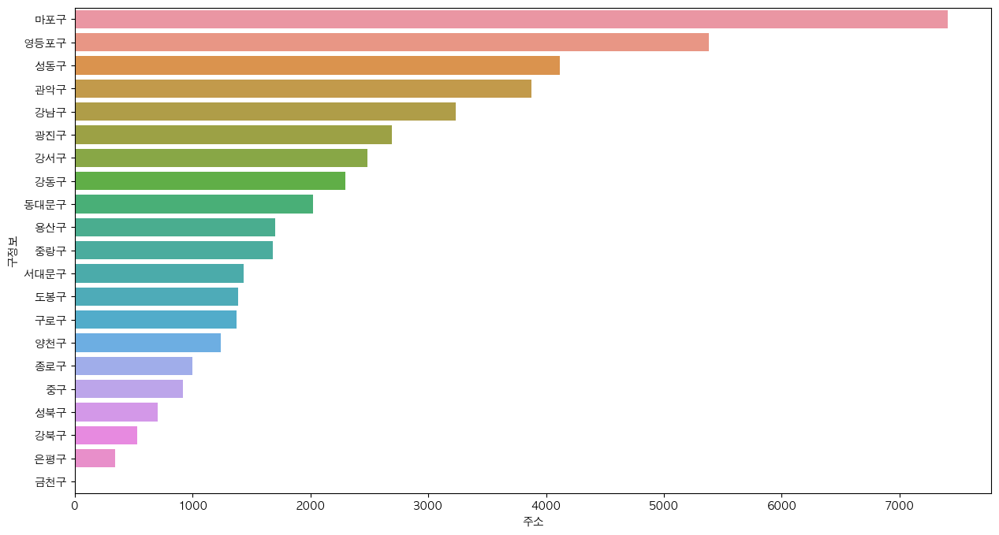

In [16]:
plt.figure(figsize = (15, 8))
sns.barplot(y = adr.index, x = adr["주소"])
plt.show()

- 가장 많은 견인 수가 발생하는 것은 마포구와, 영등포구, 성동구순으로 확인된다.

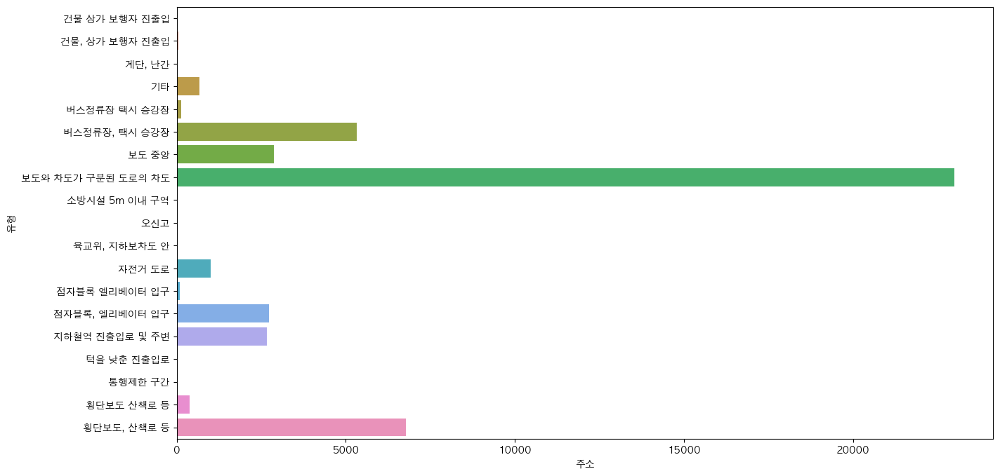

In [17]:
plt.figure(figsize = (15, 8))
sns.barplot(y = type_1.index, x = type_1["주소"])
plt.show()

- 가장 많은 유형이 보도와 차도가 구분된 도로의 차도로 확인할 수 있고 그 뒤로 횡단보도, 산책로와 버스정류장, 택시 승강장이 뒤를 잇고있다.

In [18]:
max_human = human_df.groupby("시군구명").mean()

In [19]:
max_human = max_human.drop("서울시")

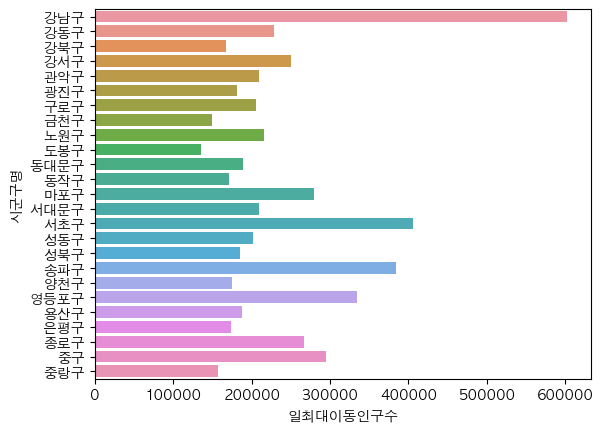

In [20]:
plt.figure()
sns.barplot(data = max_human, x = "일최대이동인구수", y = max_human.index)
plt.show()

- 일최대 이동 인구수를 비교해 봤을 때, 강남구가 가장 많고 그 뒤를 서초구, 양천구가 그 뒤를 따랐다.

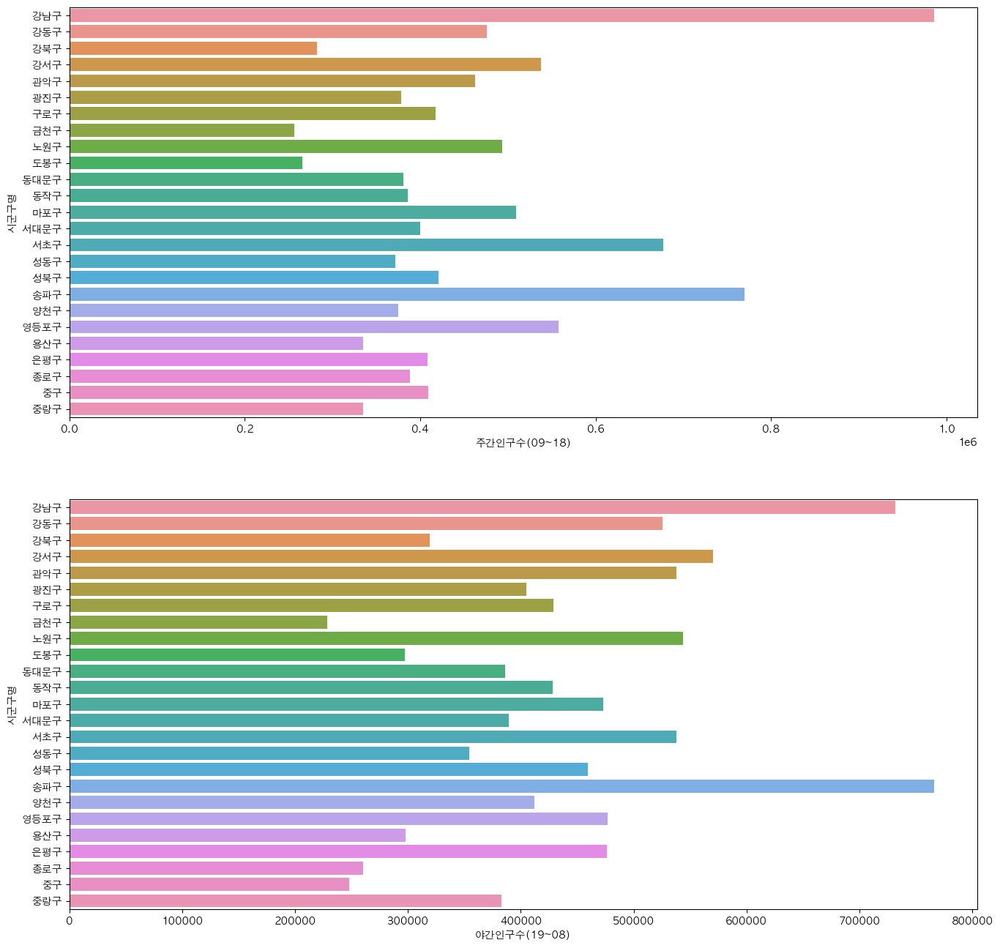

In [21]:
fig, ax = plt.subplots(nrows=2, figsize = (16, 16))

sns.barplot(data = max_human, x = "주간인구수(09~18)", y = max_human.index, ax = ax[0])
sns.barplot(data = max_human, x = "야간인구수(19~08)", y = max_human.index, ax = ax[1])
plt.show()

- 주, 야간 인구수를 비교해봤을 때, 위의 일 최대 이동 인구수 평균과 같은 양상을 보이지만 특이한점은 송파구의 야간인구수가 가장 많이 나타나는 것을 확인 할 수 있다.

# Preprocessing

In [22]:
human_df["Date"] = human_df["기준일ID"]  # 서로 두개의 데이터 프레임에서 컬럼 이름이 달라서 컬럼이름 맞추기
human_df["구정보"] = human_df["시군구명"]
human_df.drop(["기준일ID", "시군구명"], axis = 1, inplace = True) # 같은 컬럼 제거

In [23]:
human_df = human_df.set_index("구정보").drop("서울시") # 킥보드데이터에는 서울시가 아닌 구별로 집계를 하였기 때문에 서울시를 제거

In [24]:
# 킥보드 데이터와 날짜를 맞추기 위해서 집계한 날짜만 받아오고 나머지는 missing value로 변환
human_df["res"] = human_df["Date"].apply(lambda x : x if x>=20210715 and x<= 20220729 else np.NAN)

In [25]:
human_df.columns

Index(['총생활인구수', '내국인생활인구수', '장기체류외국인인구수', '단기체류외국인인구수', '일최대인구수', '일최소인구수',
       '주간인구수(09~18)', '야간인구수(19~08)', '일최대이동인구수', '서울외유입인구수',
       '동일자치구행정동간이동인구수', '자치구간이동인구수', 'Date', 'res'],
      dtype='object')

In [26]:
# 분석에 필요한 컬럼만 추출
res = human_df[['총생활인구수', '내국인생활인구수', '장기체류외국인인구수', '단기체류외국인인구수', '일최대인구수', '일최소인구수',
       '주간인구수(09~18)', '야간인구수(19~08)', '일최대이동인구수', '서울외유입인구수',
       '동일자치구행정동간이동인구수', '자치구간이동인구수', 'Date', 'res']]

In [27]:
# 결측치 제거를 통하여 같은 기간내 데이터만 남겨놓고 제거
res.dropna(inplace  = True)
res.drop("res", axis = 1, inplace = True)

In [28]:
# 날짜별로 정렬
df1 = res.sort_values("Date")
df1.reset_index(inplace = True)

In [29]:
res1 = board_df.set_index("구정보")

In [30]:
df3 = df1.groupby("Date").mean()

In [31]:
df3 = board.groupby(["Date", "구정보"], as_index=False)["유형"].count()

In [32]:
result = pd.merge(df1, df3)

In [33]:
result

,구정보,총생활인구수,내국인생활인구수,장기체류외국인인구수,단기체류외국인인구수,일최대인구수,일최소인구수,주간인구수(09~18),야간인구수(19~08),일최대이동인구수,서울외유입인구수,동일자치구행정동간이동인구수,자치구간이동인구수,Date,유형
0,영등포구,508895.10880,467761.36970,36075.49830,5058.24080,565405.03290,455718.42600,556968.83260,474556.73460,342123.51490,85797.61100,99590.12790,156735.77600,20210715,2
1,마포구,465721.85160,442562.98490,18837.98090,4320.88580,498354.94560,435890.40680,490811.05010,447800.99560,278084.38580,64258.89580,86461.87650,127363.61350,20210715,3
2,마포구,461514.54220,438700.26120,18703.99940,4110.28160,492973.21310,430346.47590,485380.32800,444467.55230,271417.35820,63908.59900,83728.80960,123779.94960,20210716,68
3,영등포구,502567.54310,461008.68560,36591.40730,4967.45010,558811.11140,450133.94550,549819.31090,468816.28040,330651.73210,83489.68180,94545.96230,152616.08800,20210716,24
4,도봉구,275400.03460,271908.64050,2937.60790,553.78620,297523.66850,249266.38900,255001.95980,289970.08810,128886.99020,16779.74830,74455.95220,37651.28970,20210719,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3388,강서구,536860.37030,523075.01970,9086.90620,4698.44430,560435.51880,515345.77460,521496.01460,547834.91010,243081.80360,72012.03740,106867.69780,64202.06840,20220729,9
3389,구로구,409831.12660,374226.84360,29866.50620,5737.77670,424482.15340,392684.08000,399913.52540,416915.12740,200544.76080,64270.15080,71097.42410,65177.18590,20220729,2
3390,관악구,468043.73610,445744.70110,19537.80530,2761.22960,526280.54190,406585.77100,419352.71620,502823.03600,184159.66630,34803.36600,92875.70420,56480.59610,20220729,20
3391,강동구,491565.09930,481007.43960,8466.42320,2091.23650,532688.05600,448152.29670,457088.75840,516191.05700,230354.34900,48464.82960,138721.77300,43167.74640,20220729,5


- 유동인구 데이터와 킥보드 견인 데이터를 통하여 2021년 7월 15일부터 2022년 7월 29일까지 약 1년치의 데이터를 병합하였다. 각 구별로 유형별로 나누었고 유형이 없는 구에는 널값이 들어갔다.

In [34]:
result.head()

,구정보,총생활인구수,내국인생활인구수,장기체류외국인인구수,단기체류외국인인구수,일최대인구수,일최소인구수,주간인구수(09~18),야간인구수(19~08),일최대이동인구수,서울외유입인구수,동일자치구행정동간이동인구수,자치구간이동인구수,Date,유형
0,영등포구,508895.10880,467761.36970,36075.49830,5058.24080,565405.03290,455718.42600,556968.83260,474556.73460,342123.51490,85797.61100,99590.12790,156735.77600,20210715,2
1,마포구,465721.85160,442562.98490,18837.98090,4320.88580,498354.94560,435890.40680,490811.05010,447800.99560,278084.38580,64258.89580,86461.87650,127363.61350,20210715,3
2,마포구,461514.54220,438700.26120,18703.99940,4110.28160,492973.21310,430346.47590,485380.32800,444467.55230,271417.35820,63908.59900,83728.80960,123779.94960,20210716,68
3,영등포구,502567.54310,461008.68560,36591.40730,4967.45010,558811.11140,450133.94550,549819.31090,468816.28040,330651.73210,83489.68180,94545.96230,152616.08800,20210716,24
4,도봉구,275400.03460,271908.64050,2937.60790,553.78620,297523.66850,249266.38900,255001.95980,289970.08810,128886.99020,16779.74830,74455.95220,37651.28970,20210719,13


In [35]:
result.isna().sum()

구정보               0
총생활인구수            0
내국인생활인구수          0
장기체류외국인인구수        0
단기체류외국인인구수        0
일최대인구수            0
일최소인구수            0
주간인구수(09~18)      0
야간인구수(19~08)      0
일최대이동인구수          0
서울외유입인구수          0
동일자치구행정동간이동인구수    0
자치구간이동인구수         0
Date              0
유형                0
dtype: int64

In [36]:
res_df = result.dropna()

# train test split

In [37]:
# 분석에 필요한 인구수 컬럼을 제외하고 제거한다.
X = res_df.drop(["유형",  "구정보", "Date"], axis = 1)
Y = res_df["유형"]

In [38]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 29)

In [39]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((2714, 12), (679, 12), (2714,), (679,))

# Model Training

- 모델 훈련은 유형(갯수) 인구수에 따라서 얼마나 발생하는지 회귀 모델을 사용할 것이고, 사용할 회귀모델은 선형회귀, 의사결정나무 및 랜덤포레스트 사용할 것이다.

## Linear Regression

In [40]:
lr_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("poly", PolynomialFeatures(degree = 2)),
    ("linear", LinearRegression())
])

In [83]:
lr_pipe.fit(x_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('poly', PolynomialFeatures()),
                ('linear', LinearRegression())])

In [84]:
lr_pipe.score(x_train, y_train)
lr_pipe.score(x_test, y_test)

0.4142816697341559

In [85]:
lr_pred = lr_pipe.predict(x_test)

In [86]:
lr_mse = mean_squared_error(y_test, lr_pred)

## Decision Tree

In [87]:
dt = DecisionTreeRegressor(max_depth=8)

In [88]:
dt.fit(x_train, y_train)

DecisionTreeRegressor(max_depth=8)

In [89]:
dt.score(x_train, y_train)

0.7806778478488853

In [90]:
pred = dt.predict(x_test)

In [91]:
dt_mse = mean_squared_error(y_test, pred)

# RandomForest with RandomSearch

In [41]:
params = { 'n_estimators' : randint(10, 100),
           'max_depth' : randint(10, 100),
           'min_samples_leaf' : randint(1, 20),
           'min_samples_split' : randint(2, 20),
            "min_impurity_decrease" : uniform(0.0001, 0.001)
            }

In [42]:
rs = RandomizedSearchCV(RandomForestRegressor(random_state = 29), params, n_jobs = -1, random_state = 29)
rs.fit(x_train, y_train)
print(f"best_param : {rs.best_params_}")
print(f"best_score : {rs.best_score_}")

best_param : {'max_depth': 95, 'min_impurity_decrease': 0.000900529325640991, 'min_samples_leaf': 3, 'min_samples_split': 10, 'n_estimators': 34}
best_score : 0.589277785075473


In [43]:
rf_rd = RandomForestRegressor(max_depth= 95, min_impurity_decrease= 0.000900529325640991,
                              min_samples_leaf= 3, min_samples_split= 10, n_estimators= 34, n_jobs = -1,
                             random_state = 29)
rf_rd.fit(x_train, y_train)

RandomForestRegressor(max_depth=95, min_impurity_decrease=0.000900529325640991,
                      min_samples_leaf=3, min_samples_split=10, n_estimators=34,
                      n_jobs=-1, random_state=29)

In [44]:
rf_pred = rf_rd.predict(x_test)

In [45]:
rf_mse = mean_squared_error(y_test, rf_pred)

In [46]:
from sklearn.tree import export_graphviz

In [50]:
estimator = rf_rd.estimators_[3]

In [49]:
estimator

DecisionTreeRegressor(max_depth=95, max_features='auto',
                      min_impurity_decrease=0.000900529325640991,
                      min_samples_leaf=3, min_samples_split=10,
                      random_state=1488202237)

In [55]:
res_df.columns

Index(['구정보', '총생활인구수', '내국인생활인구수', '장기체류외국인인구수', '단기체류외국인인구수', '일최대인구수',
       '일최소인구수', '주간인구수(09~18)', '야간인구수(19~08)', '일최대이동인구수', '서울외유입인구수',
       '동일자치구행정동간이동인구수', '자치구간이동인구수', 'Date', '유형'],
      dtype='object')

In [58]:
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X.columns,
                max_depth = 3, # 표현하고 싶은 최대 depth
                precision = 3, # 소수점 표기 자릿수
                filled = True, # class별 color 채우기
                rounded=True, # 박스의 모양을 둥글게
               )

In [59]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'decistion-tree.png', '-Gdpi=600'])

0

In [60]:
from IPython.display import Image
Image(filename = 'decistion-tree.png')

# Conclusion

In [97]:
print(f"Linear Regression's mse {lr_mse}")
print(f"Linear Regression's rmse : {np.sqrt(lr_mse)}")
print(f"Decision Tree's mse : {dt_mse}")
print(f"Decision Tree's rmse : {np.sqrt(dt_mse)}")
print(f"RandomForest's mse : {rf_mse}")
print(f"RandomForest's rmse : {np.sqrt(rf_mse)}")

Linear Regression's mse 105.00191808253285
Linear Regression's rmse : 10.247044358376364
Decision Tree's mse : 89.28397561001712
Decision Tree's rmse : 9.449019822712678
RandomForest's mse : 70.67002070273375
RandomForest's rmse : 8.406546300516863


In [98]:
print(f"훈련 데이터 스코어 : {rf_rd.score(x_train, y_train)}")
print(f"테스트 데이터 스코어 : {rf_rd.score(x_test, y_test)}")

훈련 데이터 스코어 : 0.8514198771414134
테스트 데이터 스코어 : 0.6057907580952699


- 선형회귀 분석이나의사 결정나무보다는 랜덤포레스트가 더 좋은 결과를 보였다. 하지만 모델이 데이터의 설명력이 충분하지 않다고 판단할 수 있다.

In [100]:
rd_pipe = Pipeline([
    ("pca", PCA()),
    ("random", RandomizedSearchCV(RandomForestRegressor(random_state = 29),
                                 params, n_jobs = -1, random_state = 29))
])

In [77]:
rf_rd.feature_importances_

array([0.0490445 , 0.02116854, 0.07555988, 0.05133852, 0.02716411,
       0.06269821, 0.26467972, 0.02690402, 0.02929969, 0.14808556,
       0.06310105, 0.0860697 , 0.09488649])

In [78]:
rf_rd.feature_names_in_

array(['총생활인구수', '내국인생활인구수', '장기체류외국인인구수', '단기체류외국인인구수', '일최대인구수',
       '일최소인구수', '주간인구수(09~18)', '야간인구수(19~08)', '일최대이동인구수', '서울외유입인구수',
       '동일자치구행정동간이동인구수', '자치구간이동인구수', 'Date'], dtype=object)

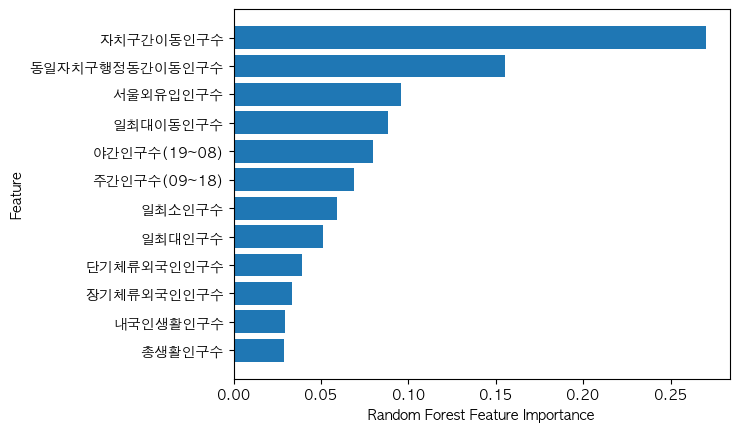

In [111]:
def plot_feature_importance(model):
    n_features = x_train.shape[1]
    plt.barh(np.arange(n_features), sorted(model.feature_importances_), align="center")
    plt.yticks(np.arange(n_features), x_train.columns)
    plt.xlabel("Random Forest Feature Importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)
    
plot_feature_importance(rf_rd)

- 피처 중요도를 확인해 봤을 때, 자치구간 이동인구수가 가장 높게 나타났고, 동일 자치구 행정동간 이동인구수가 높은 것을 확인해본 걸 통하여 위의 자치구 및 행정동간의 이동 수를 고려하여 가장 많이 킥보드를 수거하는 지점을 확인하여 수거를 한다면 비용을 절감할 수 있을 것이다.

- 위의 분석결과와 시각화 결과를 토대로 마포구 및 영등포구의 지리정보를 확인해 지도에 표시해보았다,

In [104]:
df = pd.read_csv("./data/seouldata_2.csv", encoding = "cp949", index_col = "index")

In [105]:
df = df[(df["구정보"] == "마포구") | (df["구정보"] == "영등포구")]

In [106]:
lat = df["위도"].mean()
long = df["경도"].mean()
lat, long

(37.538721943853616, 126.91903992891771)

In [107]:
# 서울 행정구역 json raw파일(githubcontent)
r = requests.get('https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json')
c = r.content
seoul_geo = json.loads(c)

In [108]:
fm = folium.Map(location=[lat, long],  zoom_start=12, tiles='cartodbpositron',
               width = 750, height = 500)

folium.GeoJson(
        seoul_geo,
        name='지역구'
    ).add_to(fm)

for _, rows in df.iterrows():
    folium.CircleMarker(location = [rows["위도"], rows["경도"]],
                       tooltip = rows["유형"], 
                       fill = True, radius = 2).add_to(fm)

fm

In [ ]:
fm.save('map.html')